<a href="https://colab.research.google.com/github/linwanlu/CNN/blob/main/clipzeroshot.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
!pip install torch torchvision
!pip install git+https://github.com/openai/CLIP.git
!pip install matplotlib opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 1.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 129.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 91.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 64.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 99.3 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalling nvidia-nvjitlink-cu12-12.5.82:
      Successfully uninstalled nvidia-nvjitli

In [ ]:
import torch
import  torchvision
from holoviews.annotators import preprocess
from torchvision.datasets  import  VOCDetection
import os
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import clip
import cv2
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import datetime
import pickle


In [ ]:
root_dir = '/content/'
voc_test = VOCDetection(
    root=root_dir,
    year='2007',
    image_set='test',
    download=True
)
print(f"Loaded {len(voc_test)} test samples.")


100%|██████████| 451M/451M [00:43<00:00, 10.3MB/s]


Loaded 4952 test samples.


In [ ]:
VOC_CLASS = [
    "aeroplane", "bicycle", "bird", "boat", "bottle",
    "bus", "car", "cat", "chair", "cow", "diningtable",
    "dog", "horse", "motorbike", "person", "pottedplant",
    "sheep", "sofa", "train", "tvmonitor"
]

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
model, preprocess = clip.load("ViT-B/32", device=device)#返回模型和模型所需的 TorchVision 轉換

text_prompts = [f"a photo of a {c}"for c in VOC_CLASS]
text_tokens = clip.tokenize(text_prompts).to(device)#返回一個 LongTensor，其中包含給定文本輸入的標記化序列。這可以用作模型的輸入

with torch.no_grad():
    text_features = model.encode_text(text_tokens)
    text_features /= text_features.norm(dim=-1,keepdim=True) #L2=vactor length ，v / ||v|| 正規化

100%|████████████████████████████████████████| 338M/338M [00:01<00:00, 194MiB/s]


In [ ]:
#取得bbox坐標和類別
def get_voc_annotations(sample):
    # sample[0]=image
    # sample[1]=target：一個字典（dict），key為 'annotation'，裡面包含了所有標註資訊（物件框座標、類別名稱、分割遮罩等）
    # {object}:[{'name','difficult','truncated','bndbox','pose'},{...}]
    annotations = sample[1]['annotation']['object']
    boxes = []
    labels = []

    #只有一個物件的時候，是字典，不是字典list
    if not isinstance(annotations, list):
        annotations = [annotations]

    for obj in annotations:
        bbox = obj['bndbox']
        xmin = float(bbox['xmin'])
        ymin = float(bbox['ymin'])
        xmax = float(bbox['xmax'])
        ymax = float(bbox['ymax'])

        class_name = obj['name']
        class_id = VOC_CLASS.index(class_name)

        boxes.append([xmin, ymin, xmax, ymax])
        labels.append(class_id)
    return boxes, labels

# clip對給定的框做分類
def clip_zeroshot_detection(img_path,boxes):
    img = Image.open(img_path).convert('RGB')
    ima_width, ima_height = img.size

    results = []

    for box in boxes:
        xmin, ymin, xmax, ymax = box
        crop_img = img.crop((xmin, ymin, xmax, ymax))
        processed_img = preprocess(crop_img).unsqueeze(0).to(device) #預處理，回傳[c,w,h]->[1,c,w,h]

        # 計算圖像特徵
        with torch.no_grad():
            image_features = model.encode_image(processed_img)
            image_features /= image_features.norm(dim=-1,keepdim=True)
                                # N*D              M*D
            similarity = (100.0 * image_features @ text_features.T).softmax(dim=-1)
            values, indices = similarity[0].topk(1)
            predicted_class = indices.item()
            score = values.item()

        results.append({
            'box': box,
            'predicted_class': predicted_class,
            'score': score
        })
    return results



def evaluate():
    y_true = []
    y_pred = []
    correct_pred = 0
    total_pred = 0

    class_correct = [0] * len(VOC_CLASS)
    class_total = [0] * len(VOC_CLASS)

    for idx in range(len(voc_test)):
        sample = voc_test[idx]
        image, annotation = sample

        img_id = annotation['annotation']['filename'].split('.')[0]
        img_path = os.path.join(root_dir, 'VOCdevkit/VOC2007/JPEGImages', f"{img_id}.jpg")

        boxes, gt_labels = get_voc_annotations(sample)
        clip_results = clip_zeroshot_detection(img_path, boxes)

        for i, result in enumerate(clip_results):
            y_pred.append(result['predicted_class'])
            y_true.append(gt_labels[i])

            total_pred += 1
            class_total[gt_labels[i]] += 1

            if result['predicted_class'] == gt_labels[i]:
                correct_pred += 1
                class_correct[gt_labels[i]] += 1

    accuracy = correct_pred / total_pred if total_pred > 0 else 0

    #類別正確率
    class_accuracy = {}
    for i in range(len(VOC_CLASS)):
        acc = class_correct[i] / class_total[i] if class_total[i] > 0 else 0
        class_accuracy[VOC_CLASS[i]] = acc

    measure_result = classification_report(y_true,y_pred)
    print('measure_result = \n',measure_result)

    cm = confusion_matrix(y_true,y_pred)
    plt.figure(figsize=(20, 16), dpi=200)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=VOC_CLASS)
    disp.plot(include_values=True,
          xticks_rotation=90,
          cmap='Blues')
    plt.tight_layout()
    plt.show()

    return {
        'accuracy': accuracy,
        'class_accuracy': class_accuracy
    }


開始 CLIP Zeroshot 測試
measure_result = 
               precision    recall  f1-score   support

           0       0.50      0.98      0.66       311
           1       0.62      0.87      0.72       389
           2       0.88      0.82      0.85       576
           3       0.90      0.66      0.76       393
           4       0.76      0.54      0.63       657
           5       0.79      0.85      0.82       254
           6       0.96      0.84      0.89      1541
           7       0.74      0.96      0.84       370
           8       0.90      0.44      0.59      1374
           9       0.75      0.79      0.77       329
          10       0.36      0.80      0.50       299
          11       0.74      0.89      0.81       530
          12       0.58      0.90      0.71       395
          13       0.58      0.94      0.71       369
          14       0.88      0.74      0.81      5227
          15       0.96      0.78      0.86       592
          16       0.85      0.75      0.8

<Figure size 4000x3200 with 0 Axes>

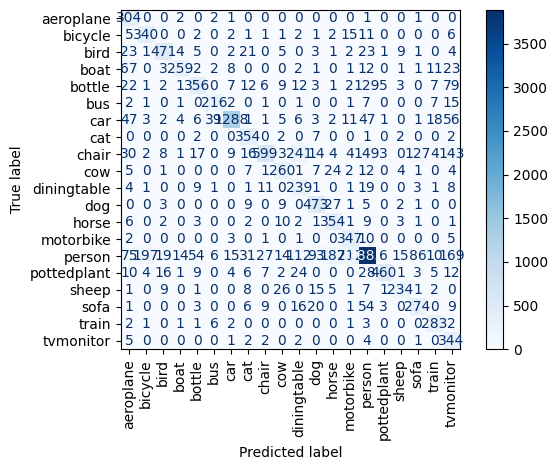

總體準確率： 0.7572115384615384
各類別準確率： {'aeroplane': 0.977491961414791, 'bicycle': 0.8740359897172236, 'bird': 0.8177083333333334, 'boat': 0.6590330788804071, 'bottle': 0.5418569254185692, 'bus': 0.8503937007874016, 'car': 0.835820895522388, 'cat': 0.9567567567567568, 'chair': 0.4359534206695779, 'cow': 0.790273556231003, 'diningtable': 0.7993311036789298, 'dog': 0.8924528301886793, 'horse': 0.8962025316455696, 'motorbike': 0.940379403794038, 'person': 0.7432561698871245, 'pottedplant': 0.777027027027027, 'sheep': 0.752411575562701, 'sofa': 0.6919191919191919, 'train': 0.9370860927152318, 'tvmonitor': 0.9529085872576177}
結束


In [ ]:
if __name__ == "__main__":
    print("開始 CLIP Zeroshot 測試")
    clip_eval = evaluate()
    print("總體準確率：", clip_eval['accuracy'])
    print("各類別準確率：", clip_eval['class_accuracy'])
    print("結束")

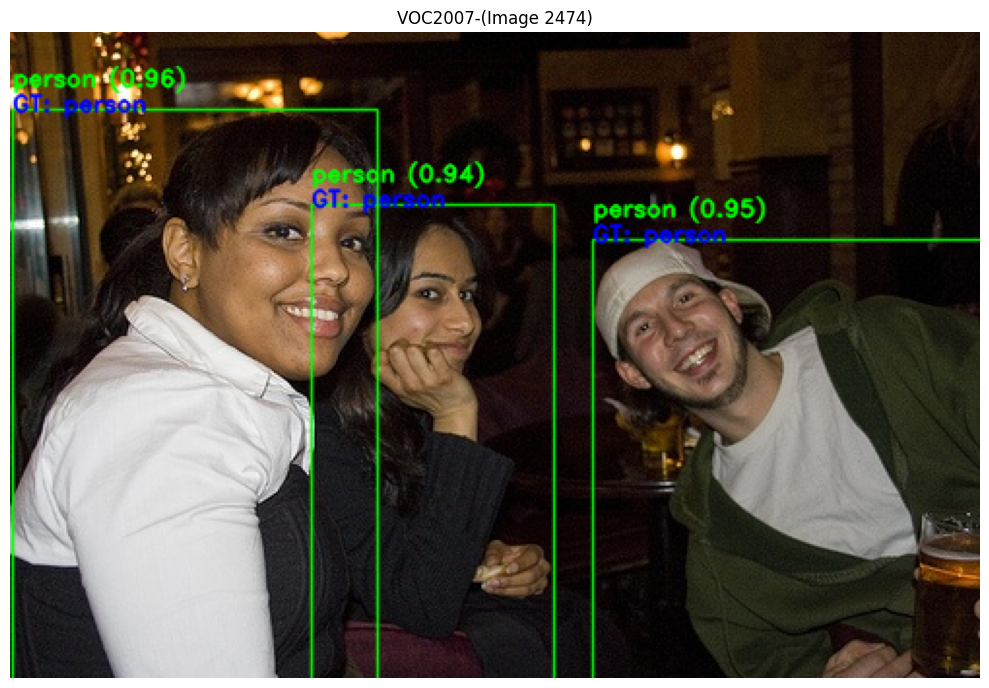

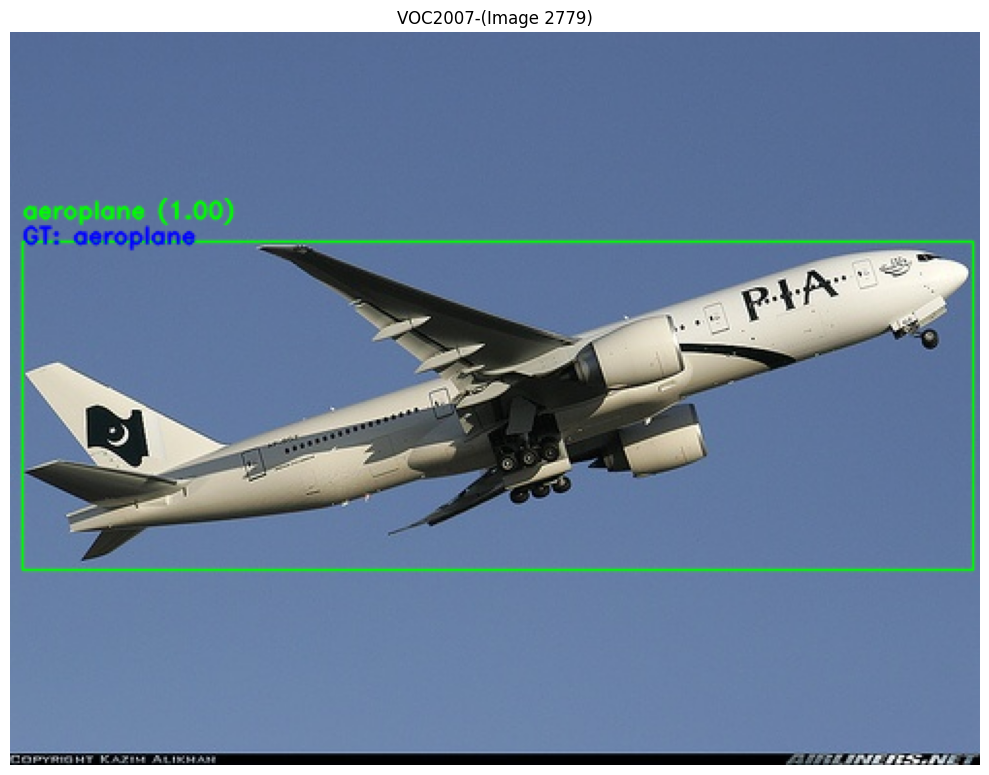

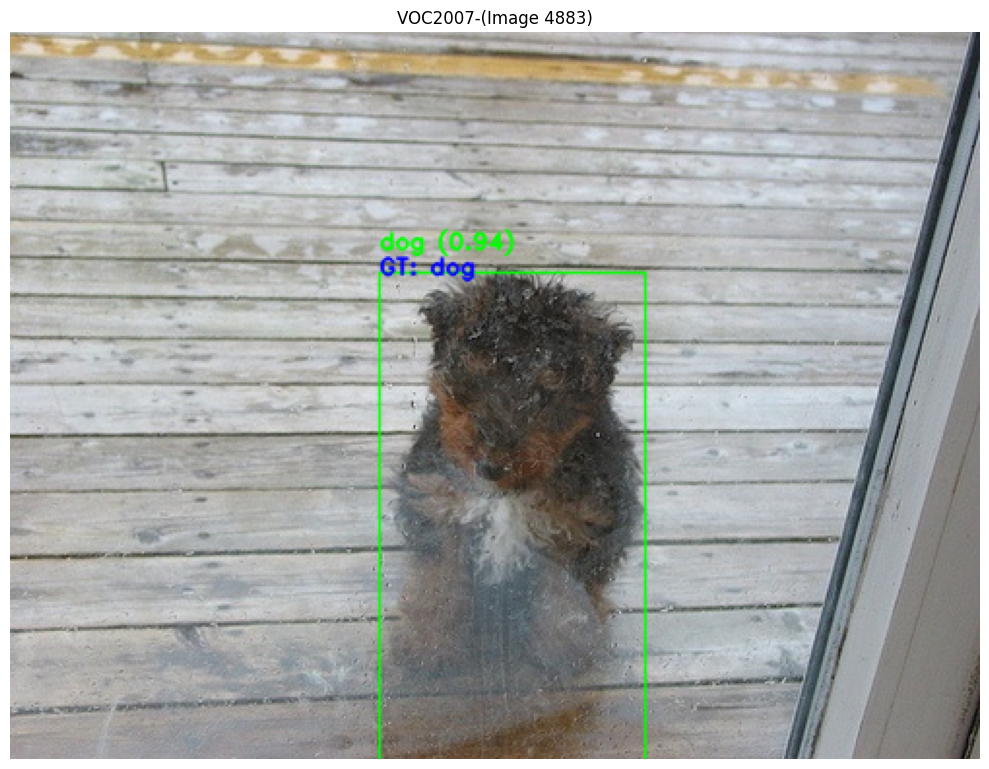

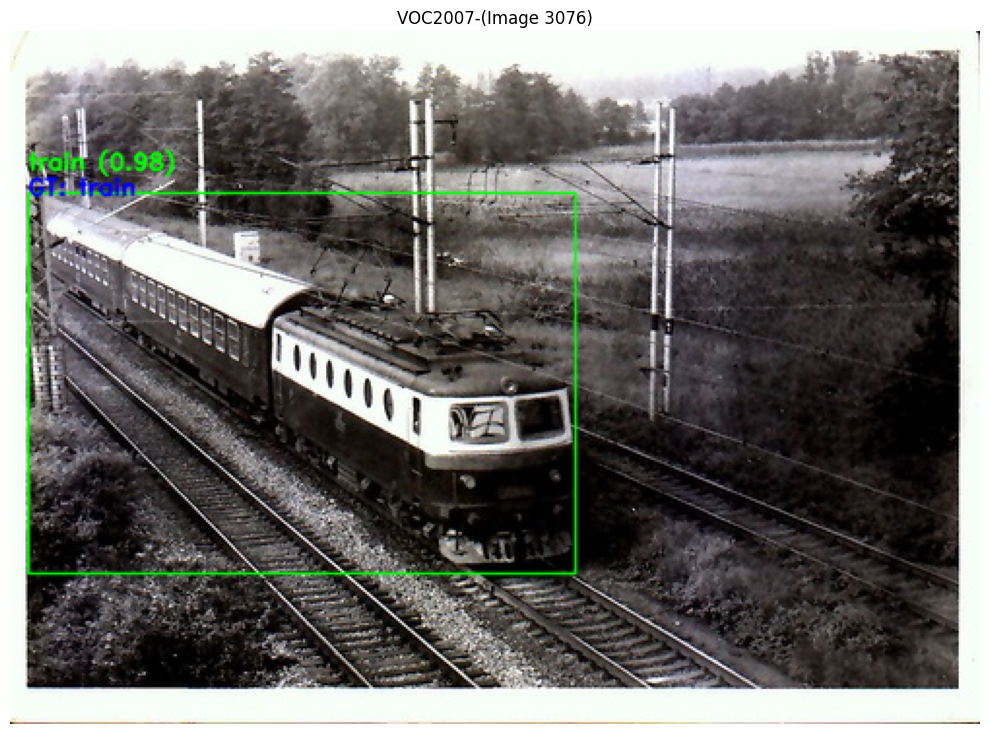

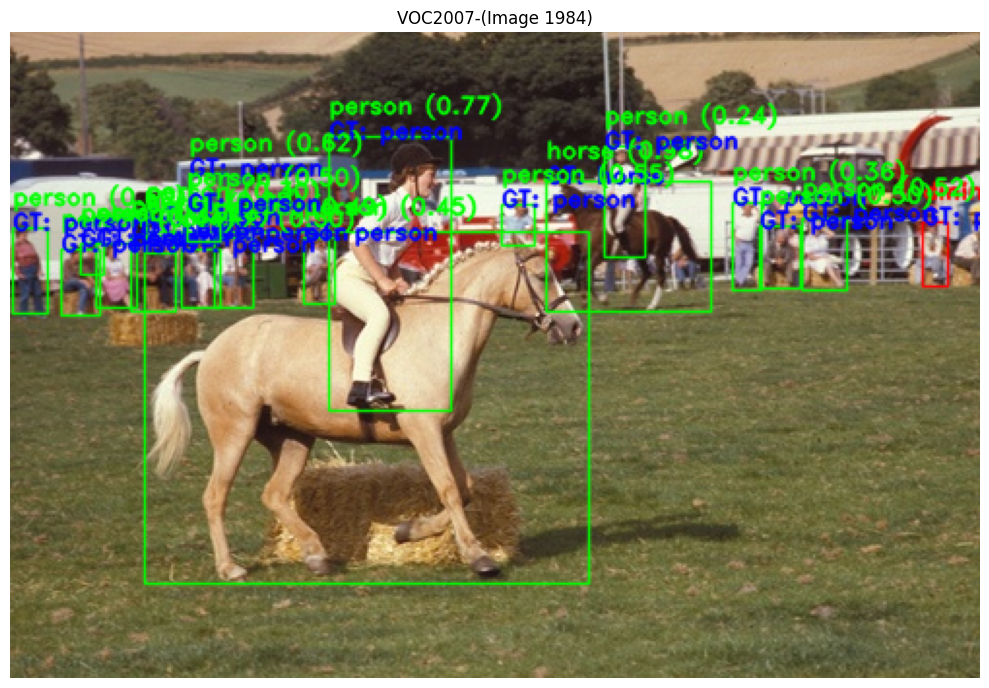

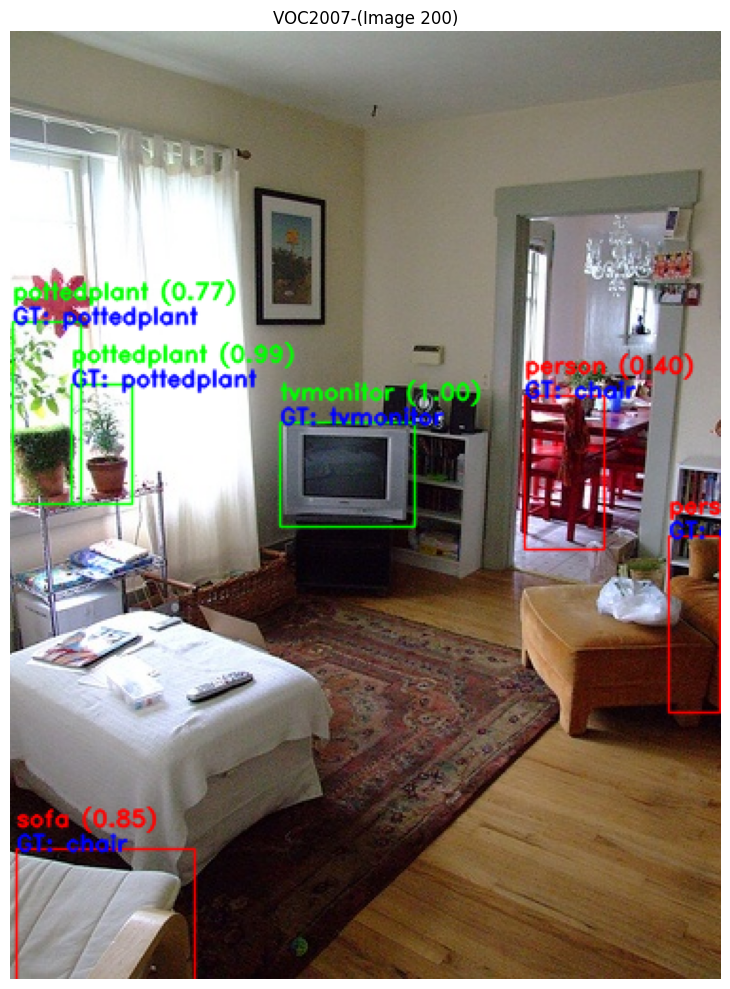

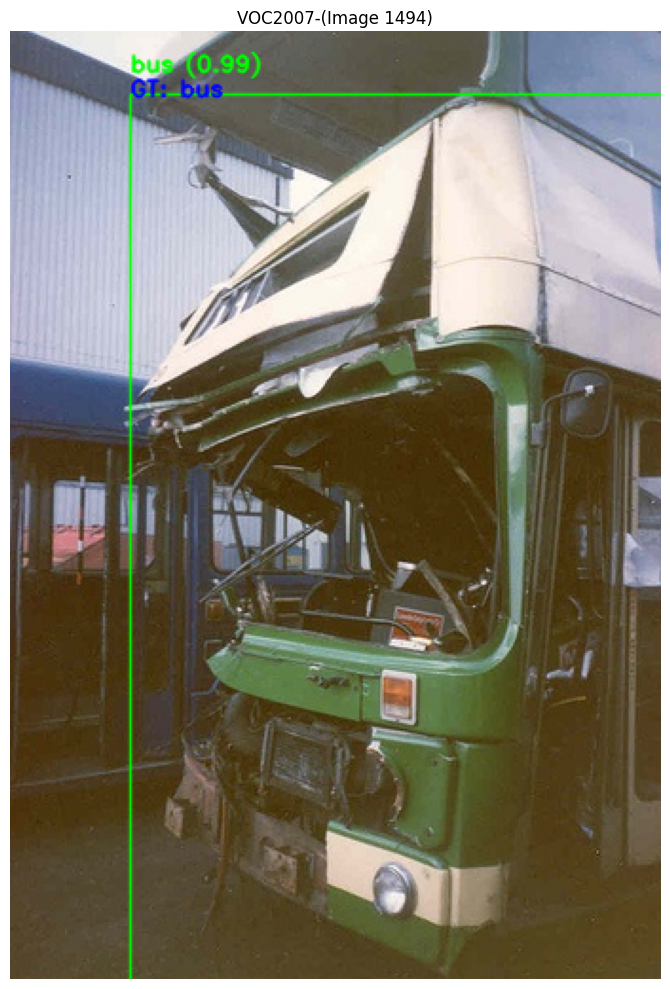

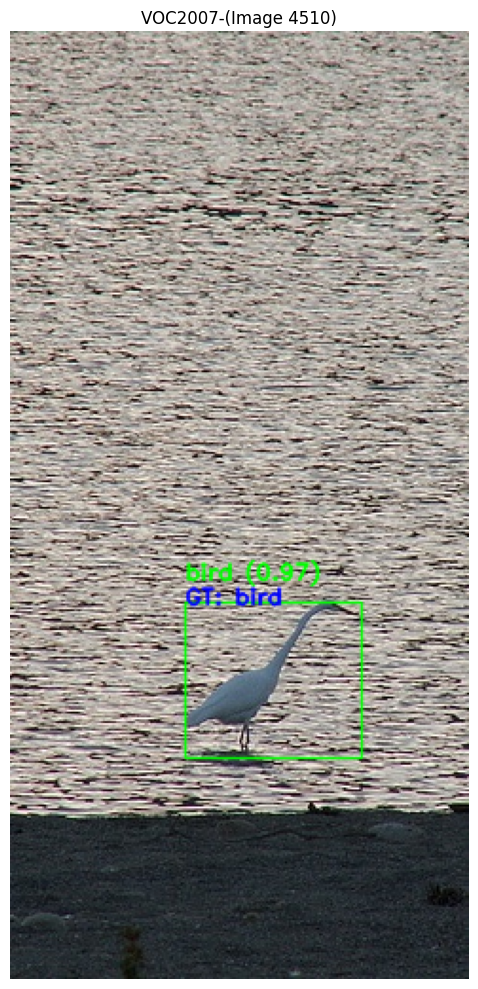

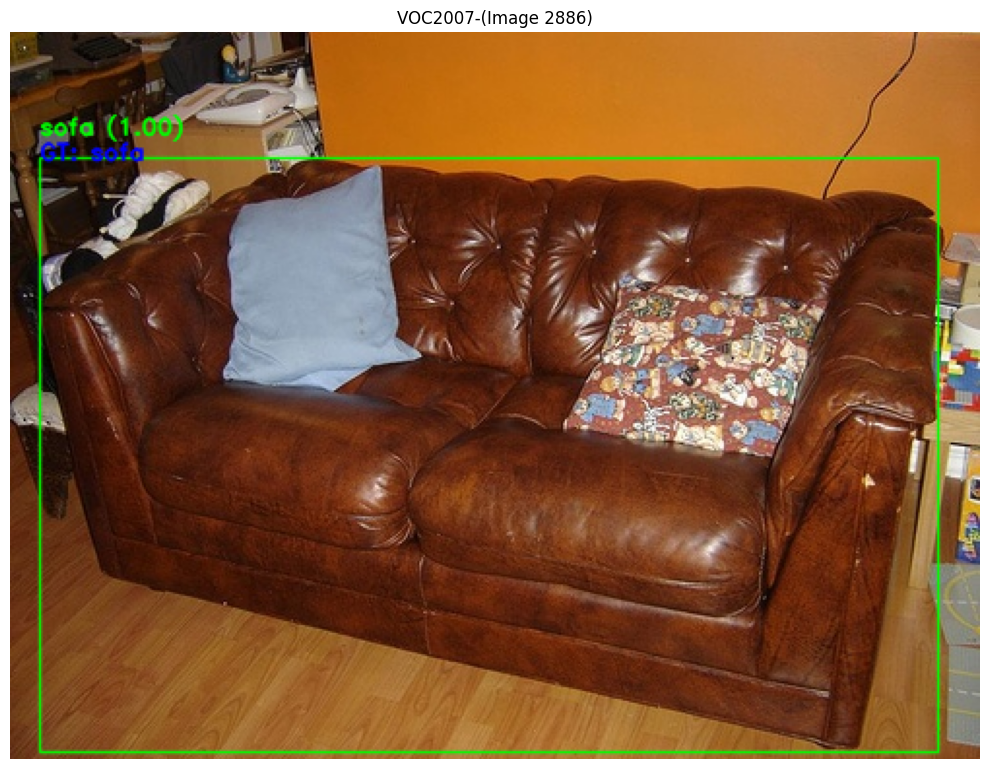

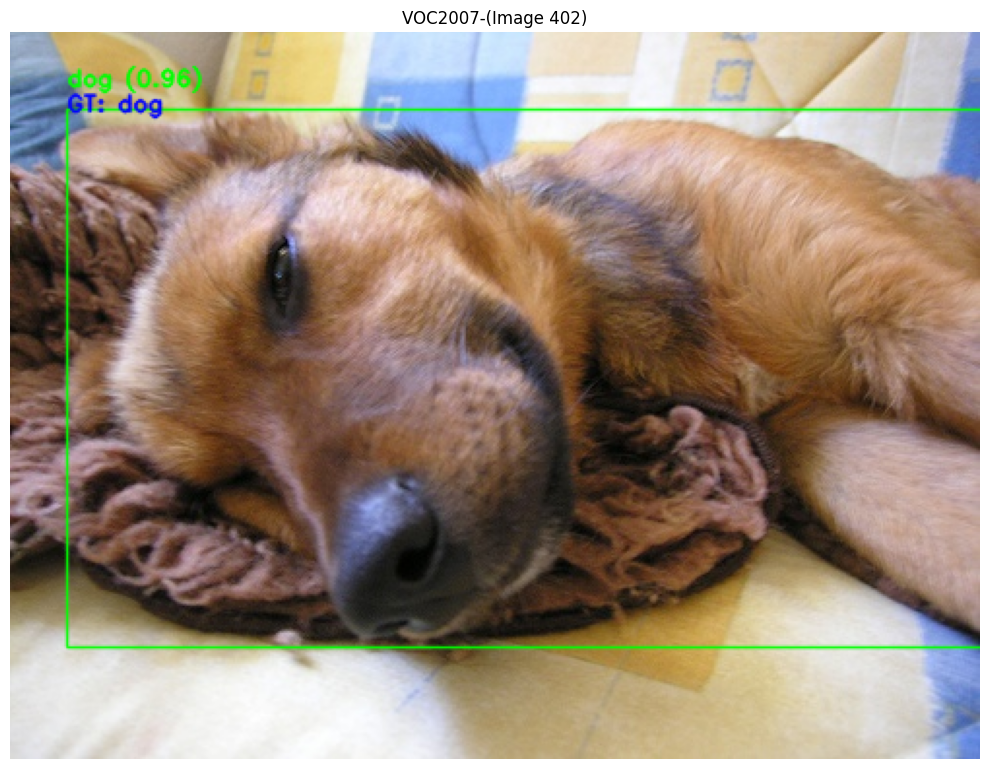

In [ ]:
import os
import random
import cv2


def visualize_results(index=0):
    sample = voc_test[index]
    image, annotation = sample

    img_id = annotation['annotation']['filename'].split('.')[0]
    img_path = os.path.join(root_dir, 'VOCdevkit/VOC2007/JPEGImages', f"{img_id}.jpg")

    boxes, gt_labels = get_voc_annotations(sample)
    clip_results  = clip_zeroshot_detection(img_path, boxes)

    img = cv2.imread(img_path) # img：(height, width, channels）& BGR
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]

    # 畫框、文字參數
    rect_thickness = 1
    font_scale     = 0.4
    text_thickness = 1

    for i, result in enumerate(clip_results):
        xmin, ymin, xmax, ymax = map(int, result['box'])
        pred_class = VOC_CLASS[result['predicted_class']]
        gt_class   = VOC_CLASS[gt_labels[i]]
        score      = result['score']
        label_txt  = f"{pred_class} ({score:.2f})"
        gt_txt     = f"GT: {gt_class}"

        # 框
        cv2.rectangle(
            img,
            (xmin, ymin),
            (xmax, ymax),
            # green                  RED
            (0,255,0) if pred_class==gt_class else (255,0,0),
            rect_thickness,
            lineType=cv2.LINE_AA #平滑直線
        )

        y_text_pred = ymin - int(30 * font_scale)
        if y_text_pred < 0:
            y_text_pred = ymax - int(60 * font_scale)

        # 字:pred
        cv2.putText(
            img,
            label_txt,
            (xmin, y_text_pred),
            cv2.FONT_HERSHEY_DUPLEX,
            font_scale,
            # GREEN                  RED
            (0,255,0) if pred_class==gt_class else (255,0,0),
            text_thickness,
            lineType=cv2.LINE_AA
        )

        y_text_gt = y_text_pred + int(20 * font_scale) + 5
        if y_text_gt > h - 5:
            y_text_gt = h - 5

        #字：GT
        cv2.putText(
            img,
            gt_txt,
            (xmin, y_text_gt),
            cv2.FONT_HERSHEY_DUPLEX,
            font_scale,
            (0,0,255),
            text_thickness,
            lineType=cv2.LINE_AA
        )

    plt.figure(figsize=(10, 10))
    plt.imshow(img)
    plt.axis('off')
    plt.title(f"VOC2007-(Image {index})")
    plt.tight_layout()
    plt.savefig(f'result_{index}.png', bbox_inches='tight')
    plt.show()


for i in random.sample(range(len(voc_test)), 10):
    visualize_results(i)